## 0. Imports & Configuration


In [1]:
from pathlib import Path
import json
import re

import numpy as np
import pandas as pd
from scipy.signal import welch
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

DATA_ROOTS = ['data/watch', 'data/phone', '.']
CSV_PATTERN = 'SESSION_*_*.csv'
FILENAME_RE = re.compile(r'^SESSION_([0-9a-fA-F]+)_(WATCH|PHONE)_(JERKING|TONIC|FALLS|TREMOR)_(\d{8})_(\d{6})\.csv$')
NUMERIC_COLUMNS = ['epoch_ms', 'event_ts_ns', 'AX', 'AY', 'AZ', 'GX', 'GY', 'GZ']
LABEL_COLORS = {'JERKING': 'tab:blue', 'TONIC': 'tab:orange', 'FALLS': 'tab:red', 'TREMOR': 'tab:green'}
EXPECTED_BANDS = {'JERKING': (2.0, 6.0), 'TONIC': (0.1, 3.0), 'FALLS': (0.1, 5.0), 'TREMOR': (6.0, 12.0)}
PLOTS_DIR = Path('plots')
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
plt.rcParams.update({'figure.figsize': (12, 8), 'axes.grid': True, 'grid.alpha': 0.25})

def parse_session_filename(path):
    match = FILENAME_RE.match(path.name)
    if not match:
        raise ValueError(f'Unrecognized filename format: {path.name}')
    session_id, device_type, label, date_str, time_str = match.groups()
    dt = pd.to_datetime(f'{date_str}{time_str}', format='%Y%m%d%H%M%S', errors='coerce')
    return {
        'session_id': session_id,
        'device_type': device_type,
        'label': label,
        'date_str': date_str,
        'time_str': time_str,
        'datetime': dt,
    }

def discover_files(data_roots):
    discovered = {}
    for root in data_roots:
        root_path = Path(root)
        if not root_path.exists():
            continue
        for path in root_path.rglob(CSV_PATTERN):
            if FILENAME_RE.match(path.name):
                discovered[str(path.resolve())] = path
    return sorted(discovered.values(), key=lambda p: str(p))

def read_raw_csv(filepath):
    df = pd.read_csv(filepath)
    had_hash_epoch = '# epoch_ms' in df.columns
    if had_hash_epoch:
        df = df.rename(columns={'# epoch_ms': 'epoch_ms'})
    for col in NUMERIC_COLUMNS:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')
    if 'epoch_ms' in df.columns:
        df = df.loc[df['epoch_ms'].notna()].copy()
    raw_has_gyro_nan = False
    if {'GX', 'GY', 'GZ'}.issubset(df.columns):
        raw_has_gyro_nan = bool(df[['GX', 'GY', 'GZ']].isna().any().any())
    row0_forward_filled = False
    if 'PHONE' in filepath.name and len(df) > 1 and {'GX', 'GY', 'GZ'}.issubset(df.columns):
        row0_nan = df.loc[df.index[0], ['GX', 'GY', 'GZ']].isna().any()
        if row0_nan:
            df.loc[df.index[0], ['GX', 'GY', 'GZ']] = df.loc[df.index[1], ['GX', 'GY', 'GZ']].to_numpy()
            row0_forward_filled = True
    return df, {
        'had_hash_epoch': had_hash_epoch,
        'has_gyro_nan': raw_has_gyro_nan,
        'row0_forward_filled': row0_forward_filled,
    }

def compute_file_metrics(df):
    n_rows = int(len(df))
    if n_rows == 0 or 'epoch_ms' not in df.columns:
        return {
            'n_rows': n_rows,
            'duration_s': np.nan,
            'median_dt_ms': np.nan,
            'inferred_fs_hz': np.nan,
            'has_large_gap': False,
            'gap_count': 0,
            'max_gap_ms': np.nan,
            'pct_windows_with_gap': 0.0,
        }
    dt_ms = pd.to_numeric(df['epoch_ms'], errors='coerce').diff()
    positive_dt = dt_ms[dt_ms > 0]
    duration_s = float((df['epoch_ms'].iloc[-1] - df['epoch_ms'].iloc[0]) / 1000.0) if n_rows > 1 else 0.0
    median_dt_ms = float(positive_dt.median()) if not positive_dt.empty else np.nan
    inferred_fs_hz = int(np.round(1000.0 / median_dt_ms)) if pd.notna(median_dt_ms) and median_dt_ms > 0 else np.nan
    gap_mask = positive_dt > 500
    gap_count = int(gap_mask.sum())
    max_gap_ms = float(positive_dt.max()) if not positive_dt.empty else np.nan
    pct_gap = float(gap_count / len(positive_dt) * 100.0) if len(positive_dt) else 0.0
    return {
        'n_rows': n_rows,
        'duration_s': duration_s,
        'median_dt_ms': median_dt_ms,
        'inferred_fs_hz': inferred_fs_hz,
        'has_large_gap': bool(gap_mask.any()),
        'gap_count': gap_count,
        'max_gap_ms': max_gap_ms,
        'pct_windows_with_gap': pct_gap,
    }

def rms(series):
    values = pd.to_numeric(series, errors='coerce').dropna().to_numpy()
    return float(np.sqrt(np.mean(np.square(values)))) if len(values) else np.nan

def compute_psd(signal, fs_hz, nperseg=128, noverlap=64):
    values = pd.to_numeric(signal, errors='coerce').dropna().to_numpy()
    if len(values) < 8 or not np.isfinite(fs_hz) or fs_hz <= 0:
        return np.array([]), np.array([])
    segment = min(nperseg, len(values))
    overlap = min(noverlap, max(0, segment // 2))
    return welch(values, fs=fs_hz, nperseg=segment, noverlap=overlap)

def dominant_psd_peak(signal, fs_hz):
    freqs, psd = compute_psd(signal, fs_hz)
    if len(freqs) <= 1:
        return np.nan, freqs, psd
    peak_idx = 1 + int(np.argmax(psd[1:]))
    return float(freqs[peak_idx]), freqs, psd

def choose_representative_session(group):
    return group.sort_values(['datetime', 'filepath']).iloc[0]


## 1. File Discovery & Metadata


In [2]:
discovered_files = discover_files(DATA_ROOTS)
print(f'Discovered {len(discovered_files)} session files.')

meta_records = []
for filepath in discovered_files:
    parsed = parse_session_filename(filepath)
    df_raw, raw_info = read_raw_csv(filepath)
    metrics = compute_file_metrics(df_raw)
    meta_records.append({
        'filepath': filepath.as_posix(),
        'session_id': parsed['session_id'],
        'device_type': parsed['device_type'],
        'label': parsed['label'],
        'datetime': parsed['datetime'],
        'n_rows': metrics['n_rows'],
        'duration_s': metrics['duration_s'],
        'inferred_fs_hz': metrics['inferred_fs_hz'],
        'has_gyro_nan': raw_info['has_gyro_nan'],
        'has_large_gap': metrics['has_large_gap'],
        'gap_count': metrics['gap_count'],
        'max_gap_ms': metrics['max_gap_ms'],
        'pct_windows_with_gap': metrics['pct_windows_with_gap'],
        'row0_forward_filled': raw_info['row0_forward_filled'],
    })

meta_df = pd.DataFrame(meta_records).sort_values(['label', 'device_type', 'datetime', 'filepath']).reset_index(drop=True)
meta_df.to_csv('session_inventory.csv', index=False)
print(meta_df.to_string(index=False))

gap_report_df = meta_df.loc[meta_df['has_large_gap'], ['filepath', 'label', 'device_type', 'gap_count', 'max_gap_ms', 'pct_windows_with_gap']]
if gap_report_df.empty:
    print('\nPer-session gap report: no gaps larger than 500 ms detected.')
else:
    print('\nPer-session gap report (>500 ms):')
    print(gap_report_df.to_string(index=False))


Discovered 128 session files.
                                                                        filepath   session_id device_type   label            datetime  n_rows  duration_s  inferred_fs_hz  has_gyro_nan  has_large_gap  gap_count  max_gap_ms  pct_windows_with_gap  row0_forward_filled
  data/datacollectionCalvin/SESSION_960708a4c5c2_PHONE_FALLS_20260408_164842.csv 960708a4c5c2       PHONE   FALLS 2026-04-08 16:48:42     131       5.305             125          True           True          1      4272.0              0.769231                 True
  data/datacollectionCalvin/SESSION_aa217a04d094_PHONE_FALLS_20260408_164918.csv aa217a04d094       PHONE   FALLS 2026-04-08 16:49:18     152       5.425             125          True           True          1      4224.0              0.662252                 True
  data/datacollectionCalvin/SESSION_21ce460b9cc6_PHONE_FALLS_20260408_165026.csv 21ce460b9cc6       PHONE   FALLS 2026-04-08 16:50:26     147       4.417             125      

## 2. Data Loading


In [3]:
sessions = {}
session_infos = {}
frames = []

for filepath in discovered_files:
    df_session, info = read_raw_csv(filepath)
    df_session['source_file'] = filepath.as_posix()
    sessions[filepath.as_posix()] = df_session
    session_infos[filepath.as_posix()] = info
    frames.append(df_session)

df_all = pd.concat(frames, ignore_index=True, sort=False) if frames else pd.DataFrame()
print(f'Loaded {len(sessions)} sessions into memory.')
print(f'df_all shape: {df_all.shape}')
print(df_all.head())


Loaded 128 sessions into memory.
df_all shape: (155908, 11)
       epoch_ms   event_ts_ns        AX         AY        AZ        GX        GY        GZ  label     sessionID                                        source_file
0  1.775692e+12  1.082533e+15 -1.376666 -10.070012 -0.665588 -0.010385  0.018326  0.004276  FALLS  07b241400a9f  data/datacollectionCalvin/SESSION_07b241400a9f...
1  1.775692e+12  1.082533e+15 -1.290475 -10.026917 -0.749385 -0.010385  0.018326  0.004276  FALLS  07b241400a9f  data/datacollectionCalvin/SESSION_07b241400a9f...
2  1.775692e+12  1.082533e+15 -1.228225  -9.957485 -0.835576 -0.010385  0.018326  0.004276  FALLS  07b241400a9f  data/datacollectionCalvin/SESSION_07b241400a9f...
3  1.775692e+12  1.082533e+15 -1.130063  -9.876082 -0.883460 -0.010385  0.018326  0.004276  FALLS  07b241400a9f  data/datacollectionCalvin/SESSION_07b241400a9f...
4  1.775692e+12  1.082533e+15 -1.108515  -9.830592 -0.895431 -0.010385  0.018326  0.004276  FALLS  07b241400a9f  data/datacol

## 3. Per-Session Signal Plots (Time Domain)


In [4]:
representatives = (
    meta_df.sort_values(['label', 'device_type', 'datetime', 'filepath'])
    .drop_duplicates(['label', 'device_type'])
    .reset_index(drop=True)
)

for _, row in representatives.iterrows():
    session_path = row['filepath']
    df_session = sessions[session_path]
    elapsed_s = (df_session['epoch_ms'] - df_session['epoch_ms'].iloc[0]) / 1000.0
    fig, axes = plt.subplots(3, 2, figsize=(14, 10), sharex=True)
    fig.suptitle(f"Representative Time-Series: {row['label']} {row['device_type']}\n{Path(session_path).name}")
    row_pairs = [('AX', 'GX'), ('AY', 'GY'), ('AZ', 'GZ')]
    color = LABEL_COLORS[row['label']]
    for plot_row, (acc_col, gyro_col) in enumerate(row_pairs):
        acc_ax = axes[plot_row, 0]
        gyro_ax = axes[plot_row, 1]

        acc_rms = rms(df_session[acc_col])
        gyro_rms = rms(df_session[gyro_col])

        acc_ax.plot(elapsed_s, df_session[acc_col], color=color, linewidth=1.0, label=f"{row['label']} {row['device_type']}")
        gyro_ax.plot(elapsed_s, df_session[gyro_col], color=color, linewidth=1.0, label=f"{row['label']} {row['device_type']}")

        acc_ax.set_title(f'{acc_col} | RMS={acc_rms:.3f}')
        gyro_ax.set_title(f'{gyro_col} | RMS={gyro_rms:.3f}')
        acc_ax.set_ylabel('Acceleration (m/s²)')
        gyro_ax.set_ylabel('Angular velocity (rad/s)')
        acc_ax.legend(loc='upper right')
        gyro_ax.legend(loc='upper right')

    axes[-1, 0].set_xlabel('Elapsed time (s)')
    axes[-1, 1].set_xlabel('Elapsed time (s)')
    fig.tight_layout()
    out_path = PLOTS_DIR / f"timeseries_{row['label']}_{row['device_type']}.png"
    fig.savefig(out_path, dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)
    print(f'Saved {out_path.as_posix()}')


/tmp/ipykernel_4843/3392898288.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Saved plots/timeseries_FALLS_PHONE.png


/tmp/ipykernel_4843/3392898288.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Saved plots/timeseries_FALLS_WATCH.png
Saved plots/timeseries_JERKING_PHONE.png


/tmp/ipykernel_4843/3392898288.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Saved plots/timeseries_JERKING_WATCH.png
Saved plots/timeseries_TONIC_PHONE.png


/tmp/ipykernel_4843/3392898288.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Saved plots/timeseries_TONIC_WATCH.png
Saved plots/timeseries_TREMOR_PHONE.png
Saved plots/timeseries_TREMOR_WATCH.png


/tmp/ipykernel_4843/3392898288.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Saved plots/timeseries_TREMOR_WATCH.png


/tmp/ipykernel_10181/3392898288.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


## 4. Power Spectral Density Comparison


In [5]:
psd_rows = []
watch_meta = meta_df.loc[meta_df['device_type'] == 'WATCH'].copy()
for _, row in watch_meta.iterrows():
    df_session = sessions[row['filepath']]
    peak_hz, freqs, psd = dominant_psd_peak(df_session['AY'], row['inferred_fs_hz'])
    lo_hz, hi_hz = EXPECTED_BANDS[row['label']]
    psd_rows.append({
        'filepath': row['filepath'],
        'label': row['label'],
        'inferred_fs_hz': row['inferred_fs_hz'],
        'peak_hz': peak_hz,
        'expected_lo_hz': lo_hz,
        'expected_hi_hz': hi_hz,
        'peak_outside_band': bool(pd.notna(peak_hz) and not (lo_hz <= peak_hz <= hi_hz)),
        'freqs': freqs,
        'psd': psd,
    })

psd_results = pd.DataFrame(psd_rows)

representative_psd_rows = []
for label in ['JERKING', 'TONIC', 'FALLS', 'TREMOR']:
    subset = psd_results.loc[psd_results['label'] == label].copy()
    if subset.empty:
        continue
    subset = subset.sort_values(['filepath'])
    bad_subset = subset.loc[subset['peak_outside_band']].copy()
    if label == 'JERKING' and not bad_subset.empty:
        chosen = bad_subset.sort_values(['inferred_fs_hz', 'filepath'], ascending=[False, True]).iloc[0]
    elif not bad_subset.empty:
        chosen = bad_subset.iloc[0]
    else:
        chosen = subset.iloc[0]
    representative_psd_rows.append(chosen.to_dict())

representative_psd_df = pd.DataFrame(representative_psd_rows)

fig, ax = plt.subplots(figsize=(12, 8))
for _, row in representative_psd_df.iterrows():
    freqs = row['freqs']
    psd = row['psd']
    if len(freqs) <= 1:
        continue
    ax.loglog(freqs[1:], psd[1:], linewidth=2.0, color=LABEL_COLORS[row['label']], label=f"{row['label']} ({int(row['inferred_fs_hz'])} Hz)")

ax.axvspan(2.0, 6.0, color='tab:blue', alpha=0.1, label='JERKING band: 2-6 Hz')
ax.axvspan(6.0, 12.0, color='tab:green', alpha=0.1, label='TREMOR band: 6-12 Hz')

annotation_rows = []
for label in ['JERKING', 'TONIC', 'FALLS', 'TREMOR']:
    subset = psd_results.loc[(psd_results['label'] == label) & (psd_results['peak_outside_band'])].copy()
    if subset.empty:
        continue
    subset = subset.sort_values(['filepath'])
    if label == 'JERKING':
        flagged = subset.sort_values(['inferred_fs_hz', 'filepath'], ascending=[False, True]).iloc[0]
    else:
        flagged = subset.iloc[0]
    annotation_rows.append(flagged)

for flagged in annotation_rows:
    peak_hz = float(flagged['peak_hz'])
    lo_hz = float(flagged['expected_lo_hz'])
    hi_hz = float(flagged['expected_hi_hz'])
    label = flagged['label']
    ax.axvline(peak_hz, color='red', linestyle='--', linewidth=1.4, label=f"⚠ {label}: peak at {peak_hz:.1f} Hz (expected {lo_hz:g}-{hi_hz:g} Hz)")

ax.set_title('Watch AY Welch PSD Comparison')
ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('PSD (AY)')
ax.legend(loc='best', fontsize=9)
fig.tight_layout()
psd_plot_path = PLOTS_DIR / 'psd_comparison.png'
# fig.savefig(psd_plot_path, dpi=150, bbox_inches='tight')
plt.show()
# plt.close(fig)
print(psd_results[['filepath', 'label', 'inferred_fs_hz', 'peak_hz', 'expected_lo_hz', 'expected_hi_hz', 'peak_outside_band']].sort_values(['label', 'filepath']).to_string(index=False))
print(f'Saved {psd_plot_path.as_posix()}')


                                                                        filepath   label  inferred_fs_hz   peak_hz  expected_lo_hz  expected_hi_hz  peak_outside_band
  data/datacollectionCalvin/SESSION_07b241400a9f_WATCH_FALLS_20260408_165226.csv   FALLS              50  1.171875             0.1             5.0              False
  data/datacollectionCalvin/SESSION_09a62ca410f4_WATCH_FALLS_20260408_165149.csv   FALLS              48  0.375000             0.1             5.0              False
  data/datacollectionCalvin/SESSION_0a061f736040_WATCH_FALLS_20260408_165156.csv   FALLS              50  0.781250             0.1             5.0              False
  data/datacollectionCalvin/SESSION_21ce460b9cc6_WATCH_FALLS_20260408_165024.csv   FALLS             250  3.906250             0.1             5.0              False
  data/datacollectionCalvin/SESSION_2ebe258f1735_WATCH_FALLS_20260408_165124.csv   FALLS              43  0.671875             0.1             5.0              False
  da

/tmp/ipykernel_4843/1661771473.py:75: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


## 5. Statistical Summary


In [6]:
summary_rows = []
for (label, device_type), group in meta_df.groupby(['label', 'device_type']):
    source_files = group['filepath'].tolist()
    ay_rms_values = [rms(sessions[path]['AY']) for path in source_files]
    gx_rms_values = [rms(sessions[path]['GX']) for path in source_files]
    dt_counts = []
    gap_counts = []
    for path in source_files:
        dt_ms = sessions[path]['epoch_ms'].diff()
        positive_dt = dt_ms[dt_ms > 0]
        dt_counts.append(len(positive_dt))
        gap_counts.append(int((positive_dt > 500).sum()))
    total_windows = int(np.sum(dt_counts))
    total_gap_windows = int(np.sum(gap_counts))
    summary_rows.append({
        'label': label,
        'device': device_type,
        'n_sessions': int(len(group)),
        'mean_duration_s': float(group['duration_s'].mean()),
        'mean_fs_hz': float(group['inferred_fs_hz'].mean()),
        'acc_rms_mean (AY)': float(np.nanmean(ay_rms_values)),
        'gyro_rms_mean (GX)': float(np.nanmean(gx_rms_values)),
        'pct_windows_with_gap': float((total_gap_windows / total_windows) * 100.0) if total_windows else 0.0,
    })

summary_df = pd.DataFrame(summary_rows).sort_values(['label', 'device']).reset_index(drop=True)

def highlight_limits(value, low=None, high=None):
    if pd.isna(value):
        return ''
    if (low is not None and value < low) or (high is not None and value > high):
        return 'background-color: #f8d7da; color: #721c24;'
    return ''

summary_style = (
    summary_df.style
    .format({
        'mean_duration_s': '{:.2f}',
        'mean_fs_hz': '{:.2f}',
        'acc_rms_mean (AY)': '{:.3f}',
        'gyro_rms_mean (GX)': '{:.3f}',
        'pct_windows_with_gap': '{:.2f}',
    })
    .map(lambda v: highlight_limits(v, 45, 55), subset=['mean_fs_hz'])
    .map(lambda v: highlight_limits(v, 0.3, 25.0), subset=['acc_rms_mean (AY)'])
    .map(lambda v: highlight_limits(v, 0.05, 5.0), subset=['gyro_rms_mean (GX)'])
    .set_caption('Per-(label, device) statistical summary with roadmap-spec highlights')
)
summary_style


,label,device,n_sessions,mean_duration_s,mean_fs_hz,acc_rms_mean (AY),gyro_rms_mean (GX),pct_windows_with_gap
0,FALLS,PHONE,16,5.66,125.00,6.466,1.264,0.25
1,FALLS,WATCH,16,5.62,96.06,2.205,0.596,0.02
2,JERKING,PHONE,15,40.76,125.00,10.014,0.034,0.79
3,JERKING,WATCH,15,40.73,68.67,7.500,0.587,2.00
4,TONIC,PHONE,17,30.65,125.00,0.851,0.021,1.05
5,TONIC,WATCH,17,30.63,50.35,1.337,0.052,0.01
6,TREMOR,PHONE,16,31.79,125.00,1.362,0.037,0.57
7,TREMOR,WATCH,16,31.74,50.00,6.049,3.162,0.10


## 6. Cross-Device Alignment (Watch vs Phone, same session_id)


Found 64 watch/phone alignment pairs.


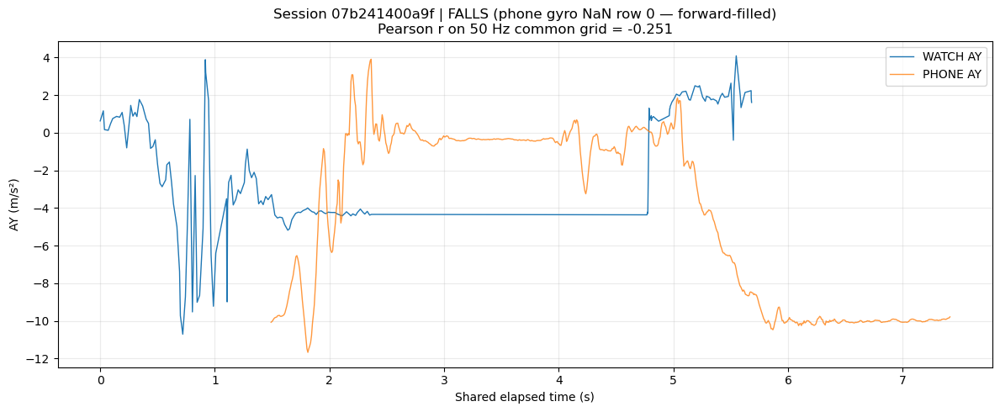

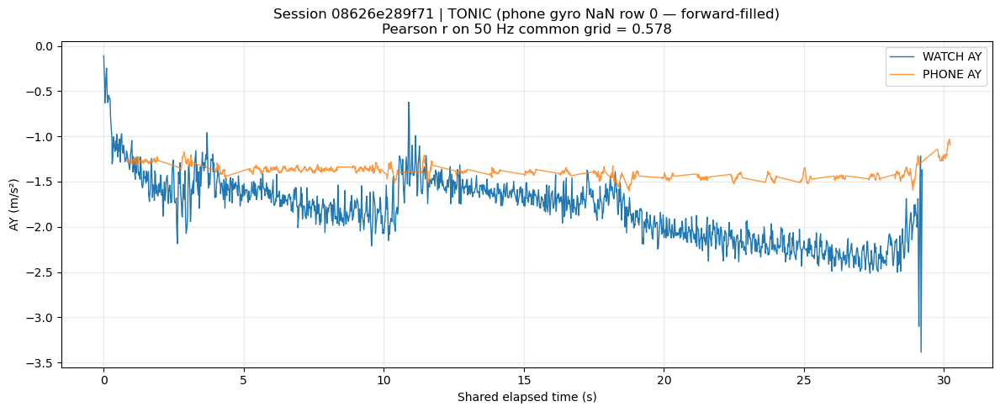

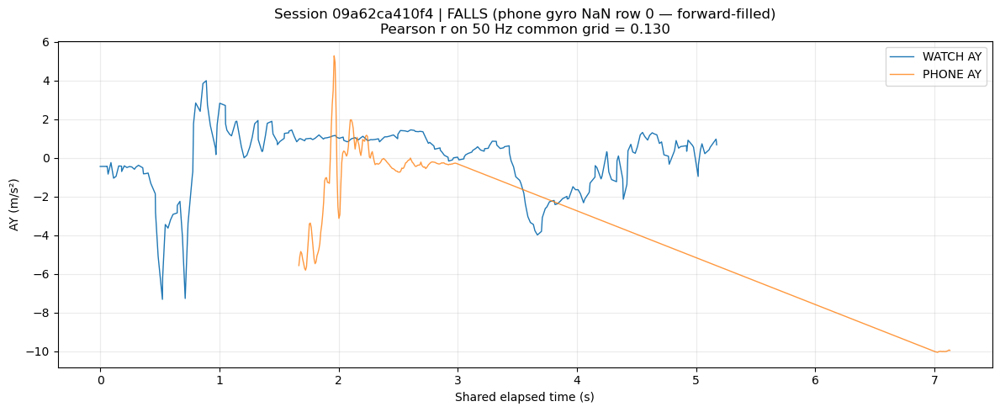

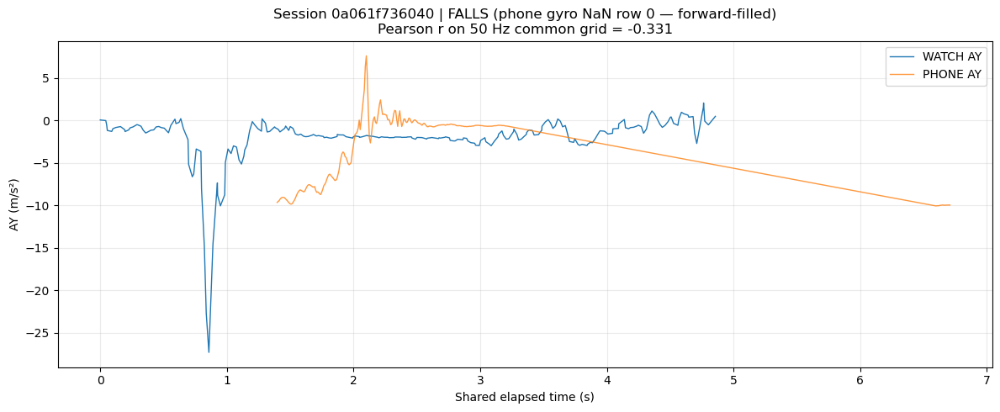

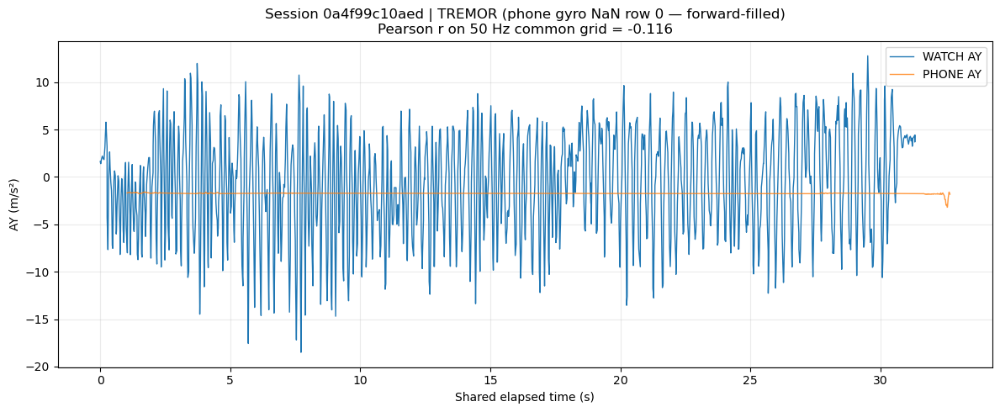

...

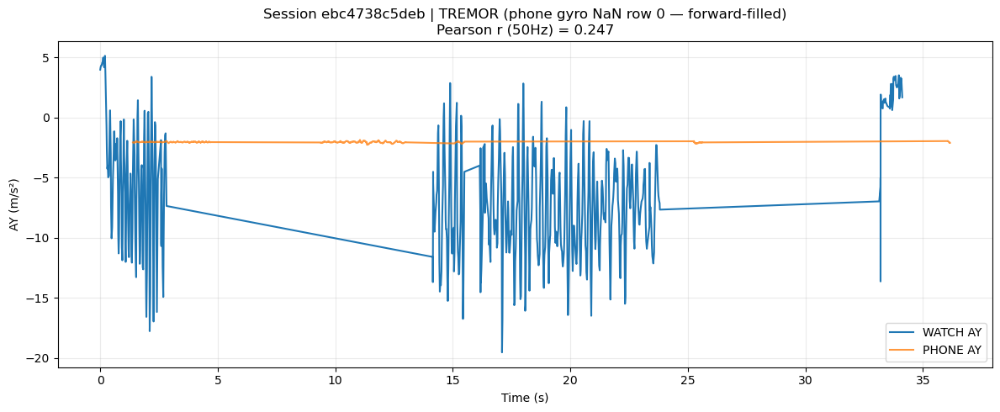

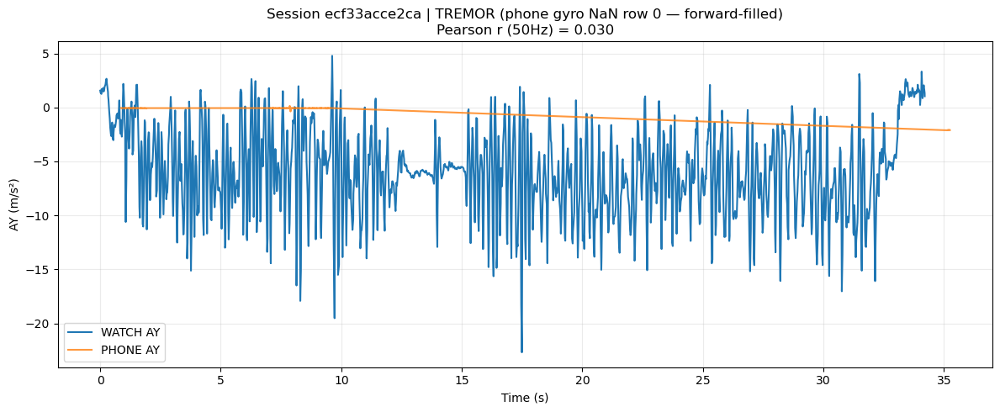

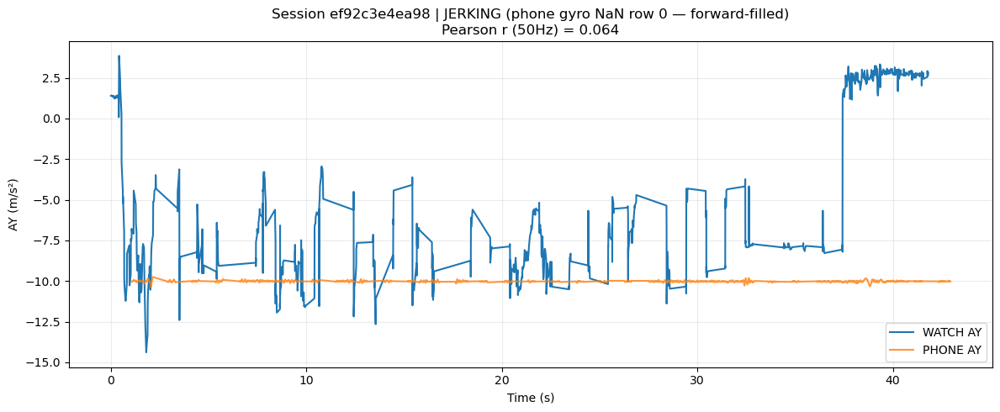

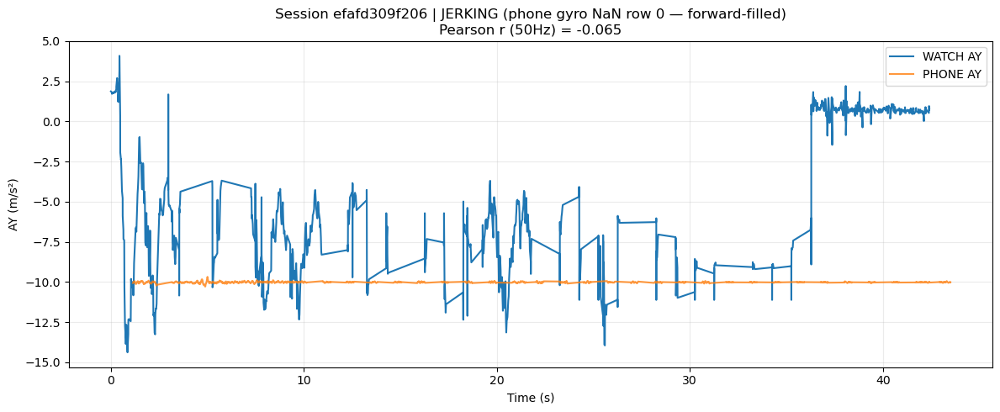

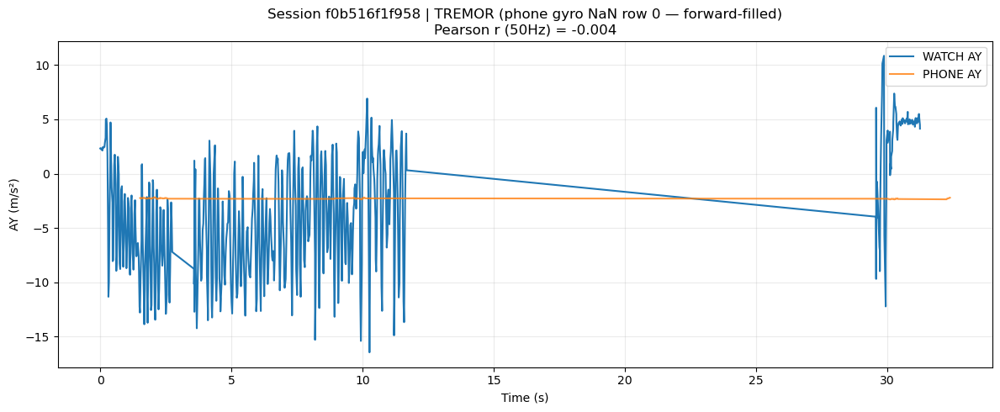

Skipping f0b9e44ca3e3 TREMOR: no overlap.


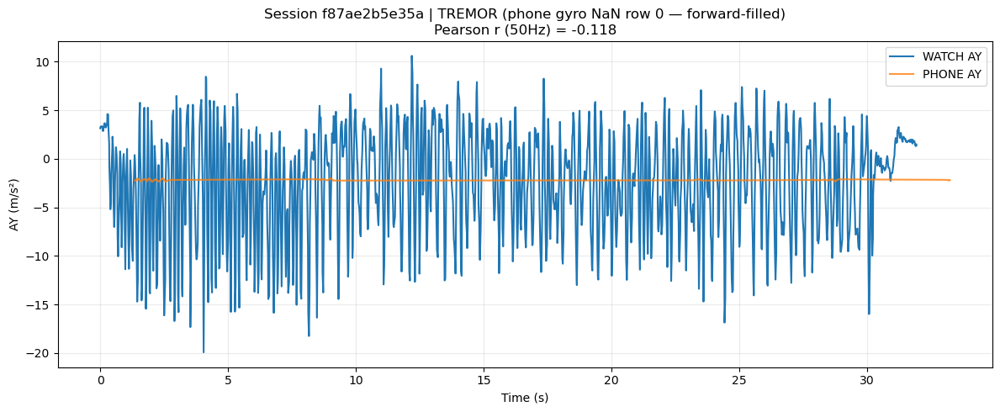

In [10]:
# Force inline rendering (safe for notebooks / VSCode)
%matplotlib inline  

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pair_rows = [
    {
        'session_id': session_id,
        'label': label,
        'watch': group.loc[group['device_type'] == 'WATCH'].iloc[0],
        'phone': group.loc[group['device_type'] == 'PHONE'].iloc[0]
    }
    for (session_id, label), group in meta_df.groupby(['session_id', 'label'])
    if {'WATCH', 'PHONE'}.issubset(set(group['device_type']))
]

print(f'Found {len(pair_rows)} watch/phone alignment pairs.')

for pair in pair_rows:
    watch_df = sessions[pair['watch']['filepath']]
    phone_df = sessions[pair['phone']['filepath']]

    # --- Normalize time ---
    t0_ms = min(watch_df['epoch_ms'].min(), phone_df['epoch_ms'].min())
    watch_t = (watch_df['epoch_ms'] - t0_ms) / 1000.0
    phone_t = (phone_df['epoch_ms'] - t0_ms) / 1000.0

    # --- Overlap ---
    overlap_start = max(watch_t.min(), phone_t.min())
    overlap_end = min(watch_t.max(), phone_t.max())

    if overlap_end <= overlap_start:
        print(f"Skipping {pair['session_id']} {pair['label']}: no overlap.")
        continue

    common_t = np.arange(overlap_start, overlap_end, 1.0 / 50.0)
    if len(common_t) < 3:
        print(f"Skipping {pair['session_id']} {pair['label']}: insufficient overlap.")
        continue

    # --- Interpolation ---
    watch_interp = np.interp(
        common_t,
        watch_t.to_numpy(),
        pd.to_numeric(watch_df['AY'], errors='coerce').to_numpy()
    )
    phone_interp = np.interp(
        common_t,
        phone_t.to_numpy(),
        pd.to_numeric(phone_df['AY'], errors='coerce').to_numpy()
    )

    # --- Correlation ---
    if np.std(watch_interp) == 0 or np.std(phone_interp) == 0:
        r_value = np.nan
    else:
        r_value = float(np.corrcoef(watch_interp, phone_interp)[0, 1])

    # --- Plot (INLINE) ---
    fig, ax = plt.subplots(figsize=(12, 5))

    ax.plot(watch_t, watch_df['AY'], label='WATCH AY')
    ax.plot(phone_t, phone_df['AY'], label='PHONE AY', alpha=0.8)

    title_note = ''
    if bool(pair['phone']['row0_forward_filled']):
        title_note = ' (phone gyro NaN row 0 — forward-filled)'

    ax.set_title(
        f"Session {pair['session_id']} | {pair['label']}{title_note}\n"
        f"Pearson r (50Hz) = {r_value:.3f}"
    )
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('AY (m/s²)')
    ax.legend()

    plt.tight_layout()
    plt.show()
    plt.close(fig)   # 🔥 critical for inline environments (prevents memory leak)

## 7. Data Quality Report


In [8]:
fs_issues = meta_df.loc[(meta_df['inferred_fs_hz'] - 50).abs() > 5].sort_values(['inferred_fs_hz', 'filepath'], ascending=[False, True])
duration_issues = meta_df.loc[meta_df['duration_s'] < 10].sort_values(['duration_s', 'filepath'])
psd_issues = psd_results.loc[psd_results['peak_outside_band']].sort_values(['label', 'peak_hz', 'filepath'])
gyro_nan_issues = meta_df.loc[meta_df['has_gyro_nan']].sort_values(['filepath'])
gap_issues = meta_df.loc[meta_df['has_large_gap']].sort_values(['max_gap_ms', 'filepath'], ascending=[False, True])

report_lines = ['# Data Quality Report', '']
report_lines.append('## Sampling-rate deviations (>10% from 50 Hz)')
if fs_issues.empty:
    report_lines.append('- None.')
else:
    for _, row in fs_issues.iterrows():
        severity = 'ERROR'
        report_lines.append(f"- [{severity}] {Path(row['filepath']).name}: inferred_fs_hz={int(row['inferred_fs_hz'])}; recommendation: confirm device configuration and resample or exclude before modelling.")
report_lines.append('')

report_lines.append('## Short recordings (<10 s)')
if duration_issues.empty:
    report_lines.append('- None.')
else:
    for _, row in duration_issues.iterrows():
        severity = 'WARNING'
        report_lines.append(f"- [{severity}] {Path(row['filepath']).name}: duration_s={row['duration_s']:.2f}; recommendation: review whether the session is long enough for stable feature extraction.")
report_lines.append('')

report_lines.append('## Dominant PSD peaks outside expected clinical band')
if psd_issues.empty:
    report_lines.append('- None.')
else:
    for _, row in psd_issues.iterrows():
        severity = 'ERROR'
        report_lines.append(f"- [{severity}] {Path(row['filepath']).name}: dominant_peak_hz={row['peak_hz']:.1f}; expected={row['expected_lo_hz']:.0f}-{row['expected_hi_hz']:.0f} Hz; recommendation: inspect labeling, sensor placement, and preprocessing.")
report_lines.append('')

report_lines.append('## Files with raw gyro NaNs')
if gyro_nan_issues.empty:
    report_lines.append('- None.')
else:
    for _, row in gyro_nan_issues.iterrows():
        severity = 'WARNING'
        report_lines.append(f"- [{severity}] {Path(row['filepath']).name}: gyro NaN detected in raw data; row 0 was forward-filled on load when applicable.")
report_lines.append('')

report_lines.append('## Files with timestamp gaps >500 ms')
if gap_issues.empty:
    report_lines.append('- None.')
else:
    for _, row in gap_issues.iterrows():
        severity = 'WARNING'
        report_lines.append(f"- [{severity}] {Path(row['filepath']).name}: max_gap_ms={row['max_gap_ms']:.1f}, gap_count={int(row['gap_count'])}; recommendation: inspect segmentation around gaps before modelling.")

quality_report = '\n'.join(report_lines)
Path('quality_report.md').write_text(quality_report, encoding='utf-8')
print(quality_report)

key_fs = fs_issues.loc[fs_issues['inferred_fs_hz'] == fs_issues['inferred_fs_hz'].max(), ['filepath', 'inferred_fs_hz']]
if not key_fs.empty:
    print('\nHighest inferred sampling-rate anomaly:')
    print(key_fs.to_string(index=False))
key_tremor = psd_issues.loc[(psd_issues['label'] == 'TREMOR') & (psd_issues['peak_hz'] < EXPECTED_BANDS['TREMOR'][0] + 0.5), ['filepath', 'peak_hz']]
if not key_tremor.empty:
    print('\nRepresentative TREMOR PSD anomaly near 3.5 Hz:')
    print(key_tremor.head(1).to_string(index=False))


# Data Quality Report

## Sampling-rate deviations (>10% from 50 Hz)
- [ERROR] SESSION_960708a4c5c2_WATCH_FALLS_20260408_164840.csv: inferred_fs_hz=333; recommendation: confirm device configuration and resample or exclude before modelling.
- [ERROR] SESSION_21ce460b9cc6_WATCH_FALLS_20260408_165024.csv: inferred_fs_hz=250; recommendation: confirm device configuration and resample or exclude before modelling.
- [ERROR] SESSION_aa217a04d094_WATCH_FALLS_20260408_164917.csv: inferred_fs_hz=200; recommendation: confirm device configuration and resample or exclude before modelling.
- [ERROR] SESSION_ef92c3e4ea98_WATCH_JERKING_20260408_104606.csv: inferred_fs_hz=167; recommendation: confirm device configuration and resample or exclude before modelling.
- [ERROR] SESSION_07b241400a9f_PHONE_FALLS_20260408_165227.csv: inferred_fs_hz=125; recommendation: confirm device configuration and resample or exclude before modelling.
- [ERROR] SESSION_08626e289f71_PHONE_TONIC_20260408_111157.csv: inferred_f